In [1]:
%matplotlib inline

import os
import numpy as np
import torch
import torchvision as torchv
from PIL import Image
from torchvision import models, transforms
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.patches import Circle
from matplotlib.patches import Rectangle
import torch.nn as nn

from mtcnn import MTCNN
from sklearn.svm import SVC  

from imutils.face_utils import FaceAligner
from imutils.face_utils import rect_to_bb
import argparse
import imutils
import dlib
import cv2

plt.rcParams.update({'figure.max_open_warning': 0})

Text(0.5, 1.0, 'Cropped')

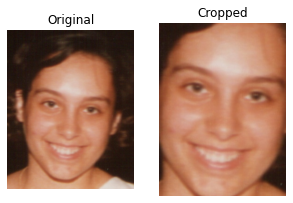

In [2]:
## Test

filename = 'archive/002A21.JPG'
# load image from file
pixels = plt.imread(filename)
# create the detector, using default weights
detector = MTCNN()
# detect faces in the image
faces = detector.detect_faces(pixels)
# display faces on the original image

confidence_cutoff = 0.9
if faces[0]['confidence'] >= confidence_cutoff:
    # get coordinates
    x1, y1, width, height = faces[0]['box']
    x2, y2 = x1 + width, y1 + height
    
crop_img = pixels[y1:y2, x1:x2]

# display the output images   
fig = plt.figure(figsize=(5, 5))

fig.add_subplot(1, 2, 1)
plt.imshow(pixels)
plt.axis('off')
plt.title('Original')

fig.add_subplot(1, 2, 2)
plt.imshow(crop_img)
plt.axis('off')
plt.title('Cropped')

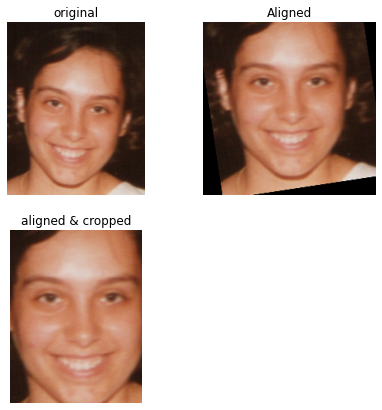

In [3]:
## Test

detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor('shape_predictor_68_face_landmarks.dat')
fa = FaceAligner(predictor, desiredFaceWidth=224)

image = plt.imread('archive/002A21.JPG')

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# show the original input image and detect faces in the grayscale image
#cv2.imshow("Input", image)
rects = detector(gray, 2)

for rect in rects:
    (x, y, w, h) = rect_to_bb(rect)
    faceOrig = image
    faceAligned = fa.align(image, gray, rect)

    # display the output images   
    fig = plt.figure(figsize=(7, 7))

    fig.add_subplot(2, 2, 1)
    plt.imshow(faceOrig)
    plt.axis('off')
    plt.title('original')

    fig.add_subplot(2, 2, 2)
    # showing image
    plt.imshow(faceAligned)
    plt.axis('off')
    plt.title('Aligned')

    # create the detector, using default weights
    detector = MTCNN()
    # detect faces in the image
    faces = detector.detect_faces(faceAligned)
    # display faces on the original image

    confidence_cutoff = 0.9
    if faces[0]['confidence'] >= confidence_cutoff:
        # get coordinates
        x1, y1, width, height = faces[0]['box']
        x2, y2 = x1 + width, y1 + height

    image = Image.fromarray(faceAligned[y1:y2, x1:x2])
    
    fig.add_subplot(2, 2, 3)
    # showing image
    plt.imshow(image)
    plt.axis('off')
    plt.title('aligned & cropped')


In [4]:
model = models.alexnet(pretrained=True)
model.classifier = nn.Sequential(*[model.classifier[i] for i in range(5)])
vector_length = 4096

#model = models.resnet101(pretrained=True)
#vector_length = 1000

In [13]:
use_cuda = torch.cuda.is_available()

preprocess  = transforms.Compose([transforms.Resize(224),
                                transforms.CenterCrop(224),
                                transforms.ToTensor()
                                 ])

preprocess2  = transforms.Compose([transforms.Resize(224),
                                transforms.CenterCrop(224),
                                transforms.RandomHorizontalFlip(p=1),
                                transforms.ToTensor()
                                ])

if use_cuda:
    model = model.cuda()

detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor('shape_predictor_68_face_landmarks.dat')
fa = FaceAligner(predictor, desiredFaceWidth=224)

def allignImag(image):
    return image
    
    # load the input image, resize it, and convert it to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    rects = detector(gray, 2)
    rect = rects[0]

    (x, y, w, h) = rect_to_bb(rect)
    #faceOrig = imutils.resize(image[y:y + h, x:x + w], width=224)
    faceAligned = fa.align(image, gray, rect)
    
    return faceAligned

def cropFace(img):
    # create the detector, using default weights
    detector = MTCNN()
    # detect faces in the image
    faces = detector.detect_faces(img)
    # display faces on the original image

    confidence_cutoff = 0.9
    if faces[0]['confidence'] >= confidence_cutoff:
        # get coordinates
        x1, y1, width, height = faces[0]['box']
        x2, y2 = x1 + width, y1 + height

    image = Image.fromarray(img[y1:y2, x1:x2])
    return image

def addToArchive(dir):
    filename = dir
    # load image from file
    image = plt.imread(filename)
    if len(image.shape) != 3:
        print (dir)
        return

    image = cropFace(allignImag(image))

    model.eval()
    vec = model(preprocess(image).view(1,3,224,224)).detach().numpy()
    archive.append(list(vec.reshape(vector_length)))
    
def get_immediate_subdirectories(a_dir):
    return [name for name in os.listdir(a_dir) 
           if '.JPG' in name]    

def recognize(dir, arc_subdir, classifier, blind=False):

    filename = dir
    # load image from file
    image = plt.imread(filename)
    if len(image.shape) != 3:
        print (dir)
        return -1
    
    cropped_image = cropFace(allignImag(image))
    
    vec = model(preprocess(cropped_image).view(1,3,224,224)).detach().numpy()
    vec = list(vec.reshape((vector_length)))
    
    pr = classifier.predict([vec])[0] 
    imgs = [diir for diir in data if f"{pr:003}" in diir]
    
    img_dir1 = dir.split('/')[-1][:-4]
    id1 = int(img_dir1[:3])
    
    img_dir2 = (imgs[0])[:-4]
    id2 = int(img_dir2[:3])
    
    if not blind:
        fig = plt.figure(figsize=(5, 5))
        fig.add_subplot(1, 3, 1)
        # showing image
        plt.imshow(image)
        plt.axis('off')
        try:    
            msg = 'id' + str(int(img_dir1[:3])) + ', ' + str(int(img_dir1[-2:])) + ' yo'
            plt.title(msg)
        except:
            msg = 'id' + str(int(img_dir1[:3])) + ', ' + str(int(img_dir1[-3:-1])) + ' yo'
            plt.title(msg)


        for ii in range(2):
            fig.add_subplot(1, 3, ii+2)
            # showing image
            im = Image.open('archive/' + imgs[-ii])
            plt.imshow(im)
            plt.axis('off')
            img_dir = (imgs[-ii])[:-4]
            id2 = int(img_dir[:3])
            msg = ''
            try:    
                msg = 'id' + str(int(img_dir[:3])) + ', ' + str(int(img_dir[-2:])) + ' yo'
            except:
                msg = 'id' + str(int(img_dir[:3])) + ', ' + str(int(img_dir[-3:-1])) + ' yo'

            if id1 == id2 :
                plt.title(msg, color='green')
            else:
                plt.title(msg, color='red')
            
    if id1 == id2:
        return 1

    return 0


In [6]:
# Clear data, print unvalid images dir

data = get_immediate_subdirectories('archive')
for dir in data:
    image = plt.imread('archive/' + dir)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    rects = detector(gray, 2)
    
    if(len(rects) != 1):
        print ('archive/' + dir)

data = get_immediate_subdirectories('test')
for dir in data:
    image = plt.imread('test/' + dir)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    rects = detector(gray, 2)
    
    if(len(rects) != 1):
        print ('test/' + dir)

KeyboardInterrupt: 

In [6]:
archiveDir = 'archive'
testDir = 'test'

data = get_immediate_subdirectories(archiveDir)

archive = []
train_y = np.empty(len(data), dtype=int)

for i, dir in enumerate(data):
    train_y[i] = int(str(dir)[:3])
    addToArchive(archiveDir + '/' + dir)
    print('Adding to archive: ' + str(i+1) + '/' + str(len(data)), end="\r")


In [3]:
print('Archived: 633 images')

Archived: 633 images


# Using SVC as a Classifier

Recognizing: 148/148
Accuracy: 26/148, (17.57%)


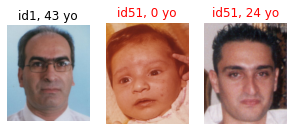

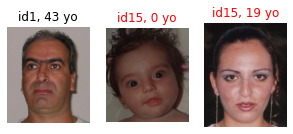

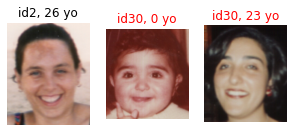

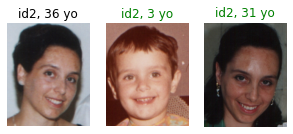

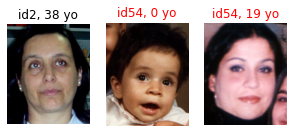

...

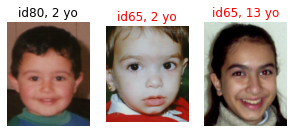

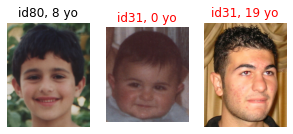

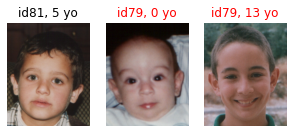

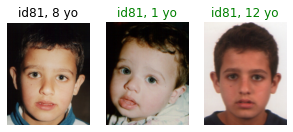

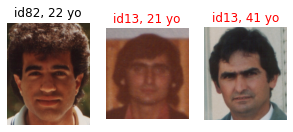

In [14]:
clf1 = SVC(kernel='linear') 
clf1.fit(archive, list(train_y))

test_data = get_immediate_subdirectories(testDir)

test_acc = 0
for i, dir in enumerate(test_data, 1):
    print('Recognizing: ' + str(i) + '/' + str(len(test_data)) , end="\r")
    test_acc = test_acc + recognize(testDir + '/' + dir, archiveDir + '/', clf1)
    
print('\nAccuracy: ' + str(test_acc) + '/' + str(len(test_data)) + ', (' + "{:.2f}".format(test_acc*100/len(test_data)) + '%)')

# Using Random Forest as a Classifier

In [16]:
from sklearn.ensemble import RandomForestClassifier

clf2 = RandomForestClassifier(n_estimators=100)
clf2.fit(archive, list(train_y))

test_data = get_immediate_subdirectories(testDir)
test_acc = 0
for i, dir in enumerate(test_data, 1):
    print('Recognizing: ' + str(i) + '/' + str(len(test_data)) , end="\r")
    test_acc = test_acc + recognize(testDir + '/' + dir, archiveDir + '/', clf2, blind=True)
    
print('\nAccuracy: ' + str(test_acc) + '/' + str(len(test_data)))

Recognizing: 148/148
Accuracy: 21/148
